In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [ ]:
df_original = pd.read_csv('./misc/df_original.csv')
df_cleaned = pd.read_csv('./misc/df_cleaned.csv')
df_imputed = pd.read_csv('./misc/df_imputed.csv')
df_results = pd.read_csv('./misc/predictions_summary.csv')

# A Project by Team AI: Is A There Data Driven Approach to Predict Life Expectancy?
**Time series prediction has been the dominate model for life expectancy prediction questions. We at Team AI propose a data driven approach to increase the interpretability of predictions obtained as well as increase in other benefits such as speed and accuracy.**



## Project Question - What is the life expectancy of a US citizen in the next decade?

### Project Aim:
 🔹**To predict the average life expectancy of the United States in the next decade using a data driven model  that can represent US’s political and economic systems.**   

 🔹**To mathematically elucidate the features that significantly affect the US’s life expectancy.**







🔴**IMPORTANT**   
**Deep note article has several limitations to be aware of.**  
⚠️**Using scroll bars to explore the dataframe and you will see empty entries. This does not mean the actual data frame is empty.**  
⚠️**You can only preview dataframes in article / dashboard setting with limited dimensions.**

# Original Dataset DataFrame: Not EDA or Machine Learning Ready

**A dataset from "The World Bank" was used.**

**Key Characteristics:**  
🔹Years (project observations) are in columns.  
🔹Factors that affects life expectancy (project independent variables) are in rows.  
🔹A lot of NaN values.  
🔹A lot of redundant columns like 'Country Name' when this dataset is specifically for life expectancy in the United States.  

In [ ]:
df_original

,Unnamed: 0,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,Unnamed: 65
0,0,United States,USA,"Internally displaced persons, new displacement...",VC.IDP.NWCV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,United States,USA,Merchandise exports to low- and middle-income ...,TX.VAL.MRCH.R2.ZS,8.668128e-01,9.685577e-01,1.272206e+00,1.306122e+00,1.061018e+00,7.634759e-01,8.847404e-01,8.111174e-01,7.840392e-01,8.008008e-01,7.635566e-01,7.045348e-01,6.444166e-01,4.955991e-01,4.929121e-01,5.933423e-01,4.300421e-01,3.704223e-01,2.853686e-01,2.317304e-01,3.215746e-01,4.504566e-01,4.666237e-01,4.254884e-01,5.974367e-01,6.615171e-01,5.797375e-01,6.226938e-01,6.186914e-01,6.024146e-01,5.977446e-01,6.128021e-01,1.197858e+00,1.599544e+00,1.234149e+00,1.144007e+00,1.267718e+00,1.230008e+00,1.223135e+00,9.622854e-01,9.502724e-01,9.772977e-01,1.025784e+00,9.410577e-01,1.033108e+00,1.158577e+00,1.273493e+00,1.528834e+00,1.933852e+00,1.492010e+00,1.574736e+00,1.899413e+00,1.831105e+00,1.833245e+00,1.717897e+00,1.312902e+00,1.335903e+00,1.363995e+00,1.331849e+00,1.320032e+00,NaN,NaN
2,2,United States,USA,Net barter terms of trade index (2000 = 100),TT.PRI.MRCH.XD.WD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.670330e+01,9.450549e+01,9.540230e+01,9.204545e+01,9.186047e+01,9.176471e+01,1.022989e+02,1.031250e+02,1.039604e+02,1.029412e+02,1.027027e+02,1.036697e+02,1.036036e+02,1.038462e+02,1.046729e+02,1.051282e+02,1.034483e+02,1.037037e+02,1.048544e+02,1.049505e+02,1.000000e+02,1.027979e+02,1.043571e+02,1.028896e+02,1.012708e+02,9.718182e+01,9.592721e+01,9.658902e+01,9.179717e+01,9.898820e+01,9.708202e+01,9.459459e+01,9.468085e+01,9.534050e+01,9.586957e+01,1.000000e+02,1.000835e+02,9.959449e+01,9.984264e+01,1.003187e+02,NaN,NaN
3,3,United States,USA,Merchandise imports from high-income economies...,TM.VAL.MRCH.HI.ZS,6.078463e+01,6.190703e+01,6.385758e+01,6.482430e+01,6.568070e+01,6.855221e+01,7.082722e+01,7.273856e+01,7.517230e+01,7.709533e+01,7.741945e+01,7.868662e+01,7.907730e+01,7.637511e+01,6.766554e+01,6.767912e+01,6.849218e+01,6.686396e+01,6.934347e+01,6.635497e+01,6.575074e+01,6.923095e+01,7.167349e+01,7.213886e+01,7.475343e+01,7.697229e+01,7.971779e+01,7.869356e+01,7.844890e+01,7.615779e+01,7.444203e+01,7.433524e+01,7.266628e+01,7.152300e+01,7.033427e+01,6.912469e+01,6.723592e+01,6.661760e+01,6.611186e+01,6.559495e+01,6.399483e+01,6.333426e+01,6.163928e+01,6.003736e+01,5.808259e+01,5.592548e+01,5.394657e+01,5.321153e+01,5.197903e+01,5.004252e+01,4.871157e+01,4.929267e+01,5.002163e+01,5.030859e+01,5.066916e+01,4.967514e+01,4.927211e+01,4.845318e+01,4.872772e+01,5.067654e+01,NaN,NaN
4,4,United States,USA,Share of tariff lines with international peaks...,TM.TAX.TCOM.IP.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.436320e+00,7.448779e+00,6.880548e+00,7.246499e+00,6.362529e+00,NaN,1.344097e+01,1.402975e+01,1.413260e+01,1.508398e+01,1.340543e+01,1.317543e+01,1.352930e+01,1.337968e+01,1.251816e+01,1.233872e+01,1.139836e+01,1.129889e+01,1.189698e+01,1.021107e+01,1.021000e+01,9.981192e+00,1.080362e+01,1.019866e+01,1.033102e+01,1.066085e+01,1.016535e+01,1.013118e+01,1.068281e+01,9.839166e+00,1.060377e+01,NaN,NaN
5,5,United States,USA,Share of tariff lines with international peaks...,TM.TAX.MANF.IP.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.087731e+01,1.096

In [ ]:
df_cleaned

Year  \
0          1960   
1          1961   
2          1962   
3          1963   
4          1964   
5          1965   
6          1966   
7          1967   
8          1968   
9          1969   
10         1970   
11         1971   
12         1972   
13         1973   
14         1974   
15         1975   
16         1976   
17         1977   
18         1978   
19         1979   
20         1980   
21         1981   
22         1982   
23         1983   
24         1984   
25         1985   
26         1986   
27         1987   
28         1988   
29         1989   
30         1990   
31         1991   
32         1992   
33         1993   
34         1994   
35         1995   
36         1996   
37         1997   
38         1998   
39         1999   
40         2000   
41         2001   
42         2002   
43         2003   
44         2004   
45         2005   
46         2006   
47         2007   
48         2008   
49         2009   
50         2010   
51         2011   
52         2012   
53         2013   
54         2014   
55         2015   
56         2016   
57         2017   
58         2018   
59         2019   
60         2020   
61  Unnamed: 65   

    Internally displaced persons, new displacement associated with conflict and violence (number of cases)  \
0                                                 NaN                                                        
1                                                 NaN                                                        
2                                                 NaN                                                        
3                                                 NaN                                                        
4                                                 NaN                                                        
5                                                 NaN                                                        
6                                                 NaN                                                        
7                                                 NaN                                                        
8                                                 NaN                                                        
9                                                 NaN                                                        
10                                                NaN                                                        
11                                                NaN                                                        
12                                                NaN                                                        
13                                                NaN                                                        
14                                                NaN                                                        
15                                                NaN                                                        
16                                                NaN                                                        
17                                                NaN                                                        
18                                                NaN                                                        
19                                                NaN                                                        
20                                                NaN                                                        
21                                                NaN                                                        
22                                                NaN                                                        
23                                                NaN                                                        
24                                                NaN          

# EDA Preprocessed DataFrame: Less Redundant and More Stable DataFrame, PCA Ready.

**Key Characteristics**  
🔹Factors that affect life expectancy (project independent variables) are now columns.  
🔹Years (project observations) are now rows.  
🔹Deletion of **945** features that were either redundant or had more than 40% missing values.  
🔹Final **498** features underwent iterative imputation so that they are complete and stable.  

In [ ]:
df_imputed

,Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports),Net barter terms of trade index (2000 = 100),Merchandise imports from high-income economies (% of total merchandise imports),Urban population (% of total population),"Population, total","Population ages 65 and above, male (% of male population)","Population ages 35-39, male (% of male population)","Population ages 10-14, male (% of male population)","Adolescent fertility rate (births per 1,000 women ages 15-19)","Labor force participation rate for ages 15-24, total (%) (national estimate)","Employment to population ratio, ages 15-24, male (%) (national estimate)",Gross savings (current LCU),GNI (current US$),Adjusted savings: net national savings (% of GNI),Adjusted savings: education expenditure (% of GNI),Gross capital formation (% of GDP),"Gross fixed capital formation, private sector (current LCU)",Final consumption expenditure (constant 2015 US$),General government final consumption expenditure (annual % growth),"Patent applications, residents",Compensation of employees (% of expense),"Risk premium on lending (lending rate minus treasury bill rate, %)",Population in urban agglomerations of more than 1 million,Agricultural nitrous oxide emissions (thousand metric tons of CO2 equivalent),CO2 emissions (metric tons per capita),"Net ODA provided, to the least developed countries (current US$)","Exports of goods, services and primary income (BoP, current US$)","Foreign direct investment, net (BoP, current US$)","Service imports (BoP, current US$)",Land area (sq. km),Agricultural land (sq. km),"Trademark applications, direct resident",Interest payments (current LCU),"Net incurrence of liabilities, total (current LCU)",Domestic credit provided by financial sector (% of GDP),Monetary Sector credit to private sector (% GDP),CO2 emissions from manufacturing industries and construction (% of total fuel combustion),Nitrous oxide emissions in energy sector (% of total),CO2 emissions from solid fuel consumption (kt),Alternative and nuclear energy (% of total energy use),"Net ODA provided, total (% of GNI)","Foreign direct investment, net inflows (BoP, current US$)","Net secondary income (BoP, current US$)","Transport services (% of service imports, BoP)","Agricultural machinery, tractors per 100 sq. km of arable land",Arable land (hectares per person),Merchandise exports (current US$),"Computer, communications and other services (% of commercial service imports)",Manufactures imports (% of merchandise imports),Merchandise trade (% of GDP),Rural population growth (annual %),"Age dependency ratio, young (% of working-age population)","Population ages 65-69, male (% of male population)","Population ages 25-29, male (% of male population)",Population ages 0-14 (% of total population),"Labor force participation rate for ages 15-24, female (%) (national estimate)","Mortality rate, neonatal (per 1,000 live births)",Terms of trade adjustment (constant LCU),GNI per capita (constant LCU),Gross domestic savings (current LCU),GDP (constant 2015 US$),Coal rents (% of GDP),Gross capital formation (current LCU),Exports of goods and services (constant 2015 US$),Arms exports (SIPRI trend indicator values),Merchandise exports to low- and middle-income economies in East Asia & Pacific (% of total merchandise exports),Travel services (% of commercial service imports),Merchandise imports (current US$),Urban population,"Population ages 65 and above, male","Population ages 35-39, female (% of female population)","Population ages 10-14, female (% of female population)","Survival to age 65, male (% of cohort)","Unemployment, male (% of male labor force) (national estimate)","Unemployment, youth total (% of total labor force ages 15-24) (national estimate)","Labor force participation rate, male (% of male population ages 15+) (national estimate)","Employment to population ratio, 15+, total (%) (national estimate)",Number of neonatal deaths,Gross sa

# Features Distribution: Drop Down Box User Interaction

🔹**Select specific features from the drop down boxes to view their distribution.**


🔴**IMPORTANT**   
⚠️**The DeepNote dropdown box feature have a maximum variable size of length 70.**  
⚠️**Since there are 498 features, there are 8 drop down boxes , hence 8 different graphs, to cover all 498 features.**



In [ ]:
dfi_features = list(df_imputed.columns)
print(len(dfi_features))

498


In [ ]:
dfi_list1=dfi_features[:70]


In [ ]:
print(len(dfi_list1))

70


In [ ]:
input1 = 'Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)'

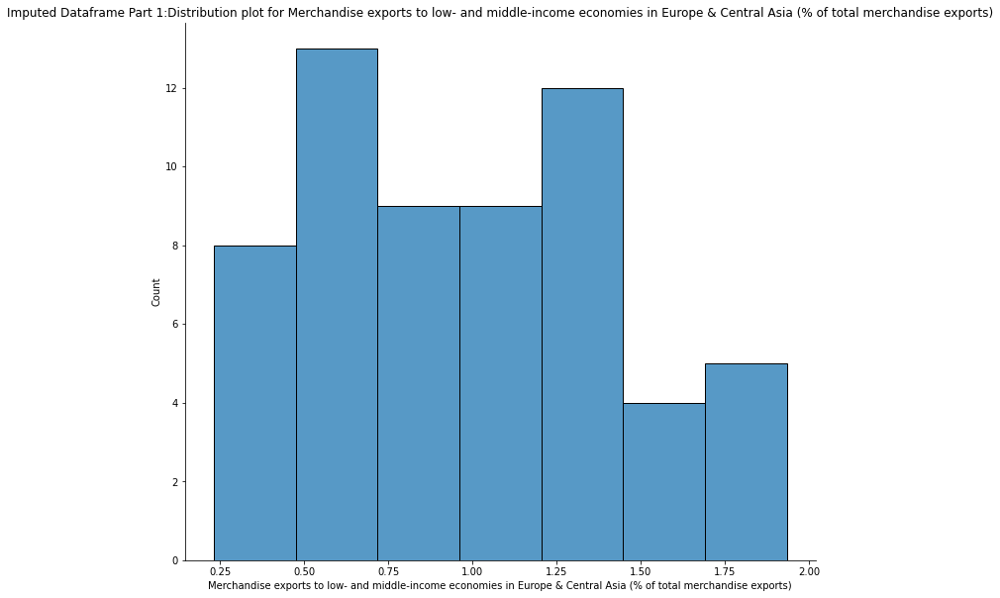

In [ ]:
sns.displot(df_imputed, x=df_imputed[input1], height=8.27, aspect=11.7/10.00)
plt.title('Imputed Dataframe Part 1:Distribution plot for %s' % (input1))

plt.show()

In [ ]:
dfi_list2=dfi_features[70:140]

In [ ]:
input2 = 'Population ages 35-39, female (% of female population)'

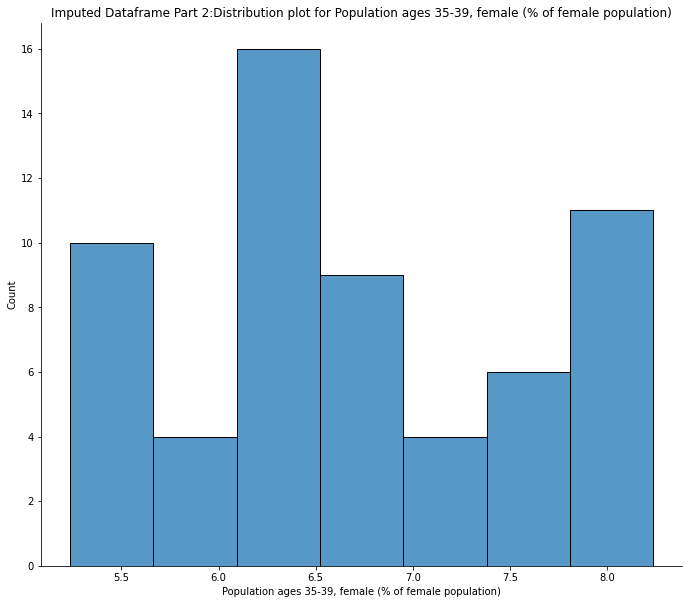

In [ ]:
sns.displot(df_imputed, x=df_imputed[input2], height=8.27, aspect=11.7/10)
plt.title('Imputed Dataframe Part 2:Distribution plot for %s' % (input2))

plt.show()

In [ ]:
dfi_list3=dfi_features[140:210]

In [ ]:
input3 = 'Trade (% of GDP)'

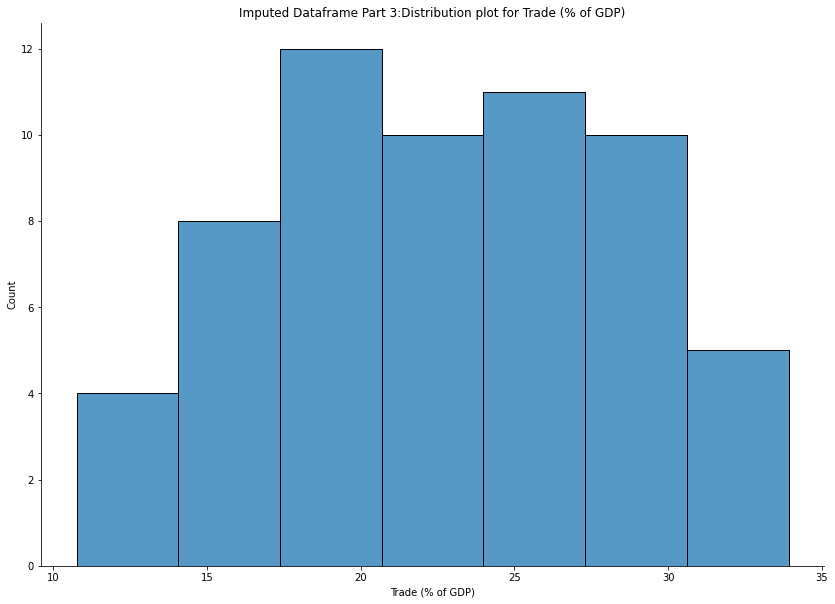

In [ ]:
sns.displot(df_imputed, x=df_imputed[input3], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 3:Distribution plot for %s' % (input3))
plt.show()

In [ ]:
dfi_list4=dfi_features[210:280]

In [ ]:
input4 = 'Food, beverages and tobacco (% of value added in manufacturing)'

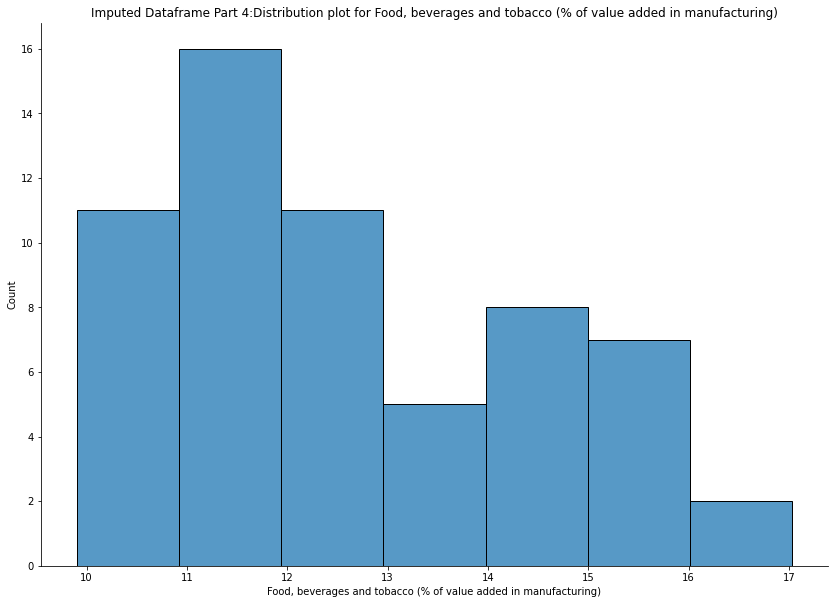

In [ ]:
sns.displot(df_imputed, x=df_imputed[input4], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 4:Distribution plot for %s' % (input4))
plt.show()

In [ ]:
dfi_list5=dfi_features[280:350]

In [ ]:
input5 = 'Fixed telephone subscriptions'

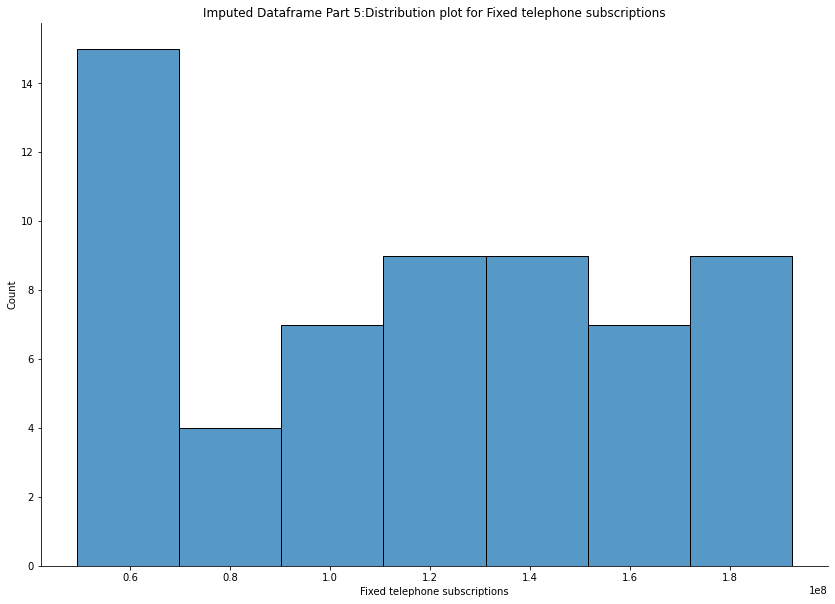

In [ ]:
sns.displot(df_imputed, x=df_imputed[input5], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 5:Distribution plot for %s' % (input5))
plt.show()

In [ ]:
dfi_list6=dfi_features[350:420]

In [ ]:
input6 = 'Fuel imports (% of merchandise imports)'

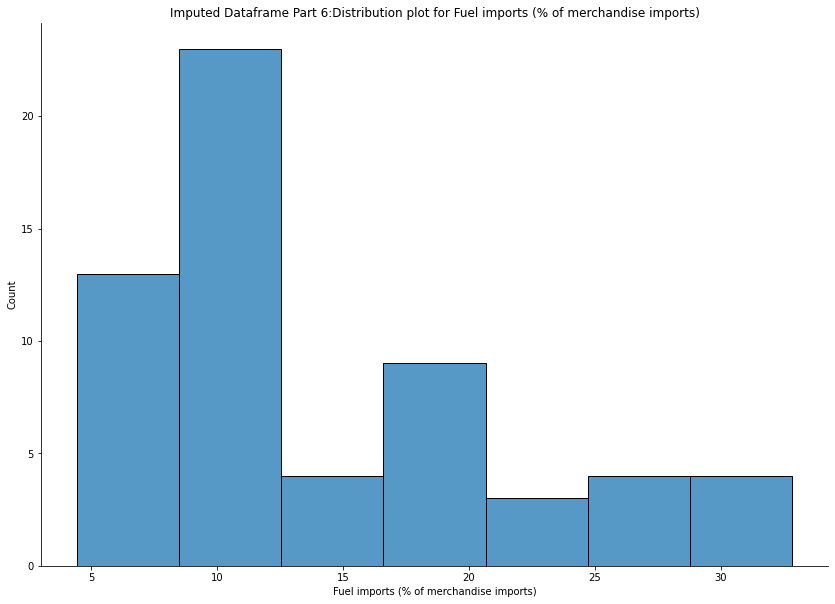

In [ ]:
sns.displot(df_imputed, x=df_imputed[input6], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 6:Distribution plot for %s' % (input6))
plt.show()

In [ ]:
dfi_list7=dfi_features[420:490]

In [ ]:
input7 = 'Population ages 15-19, male (% of male population)'

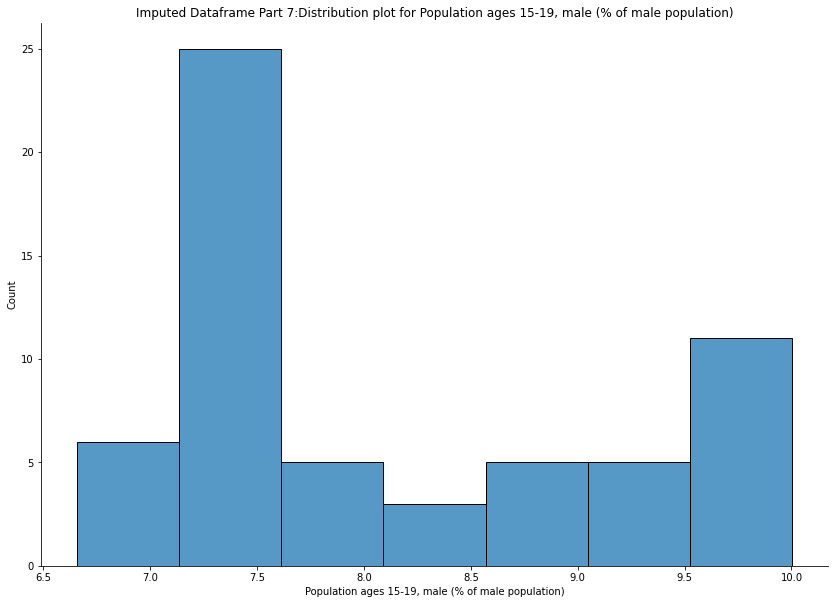

In [ ]:
sns.displot(df_imputed, x=df_imputed[input7], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 7:Distribution plot for %s' % (input7))
plt.show()

In [ ]:
dfi_list8=dfi_features[490:]

In [ ]:
input8 = 'Discrepancy in expenditure estimate of GDP (current LCU)'

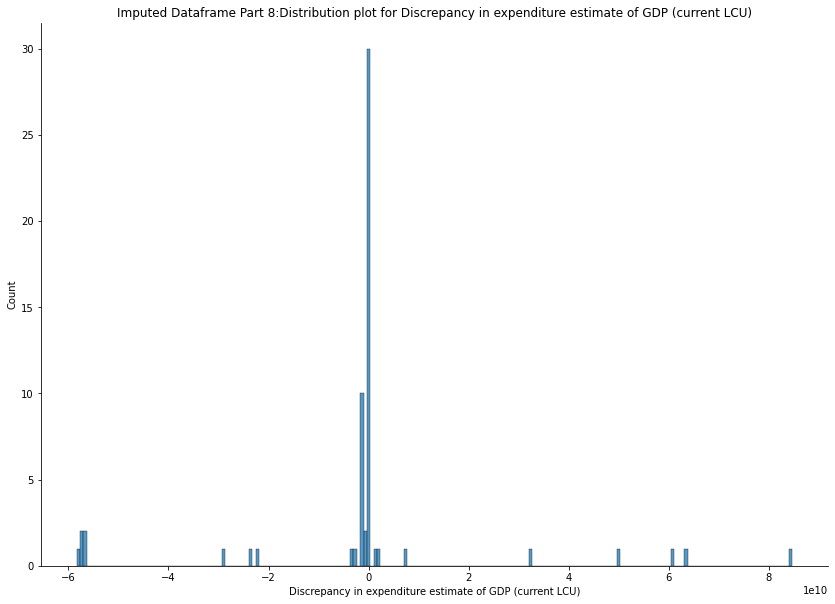

In [ ]:
sns.displot(df_imputed, x=df_imputed[input8], height=8.27, aspect=11.7/8.27)
plt.title('Imputed Dataframe Part 8:Distribution plot for %s' % (input8))
plt.show()

In [ ]:
##Frequency analysis for most frequent key words in features.
words_list=[]
for i in dfi_features:
    i.lower()
    words_list.append(i.split())

import itertools
merged_wordslist = list(itertools.chain(*words_list))

for i in merged_wordslist:
    for x in i:
        i.replace(')','')
        i.replace('(','')

from collections import Counter
counted = Counter(merged_wordslist)
key_words = list(counted.keys())

key_words.remove('to')
key_words.remove('and')
key_words.remove('&')
key_words.remove('in')

# Features Distribution: Key Word Search User Interaction

🔹**Users can search the distribution plots for any features that contains user input terms, if not interested in looking at the whole dataset.**

## Recommended Search Terms Via Frequency Analysis of Feature Names 
🔹**These are the Top 40 ~ frequent terms to help you search relevant and significant features**: 
 
'Merchandise', 'exports', 'middle-income', 'economies', 'Europe', 'Central', 'Asia', 'total', 'Net', 'barter', 'terms', 'trade', 'index', 'imports', 'high-income', 'Urban', 'Population,', 'ages', 'above,', 'male', 'Adolescent', 'fertility', 'rate', 'births', 'women', 'Labor', 'force', 'participation', 'national', 'estimate', 'Employment', 'ratio,', 'Gross', 'savings'  

For the full non-exhausitive list has more than 500 key words, check the variable 'key_words' in the code.

In [ ]:
input9 = ''

In [ ]:
collection=[]

for i in dfi_features:
    if input9 != '' and input9 in i:
        collection.append(i)
        sns.displot(df_imputed, x=df_imputed[i], height=8.27, aspect=11.7/8.27)
        plt.title('User Searched Distribution plot for %s' % (input9))
        plt.show()

if len(collection) == 0:
    print('No match')
else:
    print('Done!')

No match


# EDA Results:
🔹Recasted data types to numerical to perform machine learning tasks.<br>
🔹Made Decision to keep 57 population based features as there are a diverse number of correlations in relation to Life Expectancy.<br>
🔹Life Expectancy showed NaN values. The 2020 value was appended while, the 2021 value was dropped.


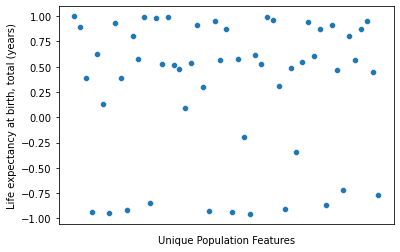

In [ ]:
PopulationDF1 = pd.DataFrame(df_cleaned['Life expectancy at birth, total (years)'])
for i in df_cleaned.columns:
    if 'Population ages' in i:
        PopulationDF1[i] = df_cleaned[i]
datasetcorr1 = PopulationDF1.corr()
scatterplot1 = sns.scatterplot(data = datasetcorr1['Life expectancy at birth, total (years)'])
scatterplot1.set(xticklabels = [],xlabel = 'Unique Population Features')
scatterplot1.tick_params(bottom=False)

<b>Heat Map of population features shows no distinct pattern between strongly correlated features.</b>

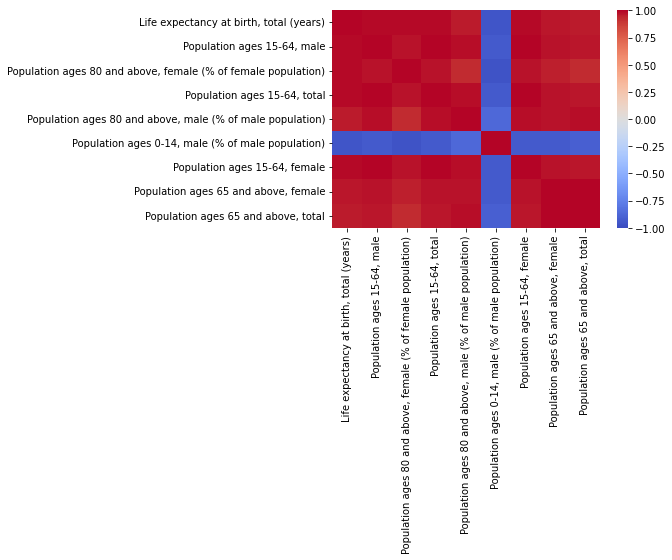

In [ ]:
datasetcorr1_copy = datasetcorr1.copy() 
for i in range(len(datasetcorr1['Life expectancy at birth, total (years)'])):
    if abs(datasetcorr1['Life expectancy at birth, total (years)'][i]) <0.95 :
        datasetcorr1_copy.drop(labels = datasetcorr1.index[i], axis = 0,inplace = True)
        datasetcorr1_copy.drop(labels = datasetcorr1.index[i], axis = 1,inplace = True)
sns.heatmap(datasetcorr1_copy,cmap='coolwarm',vmin=-1,vmax=1)
plt.show()

# PCA Key Decision: 7 Components for 90% Variance Preservation

🔹Since the resulting dataset had 498 features, PCA was conducted in order to reduce noise and increase machine learning compatibility and efficacy.

**Key Decision**  
🔹Target of 90% variance preservation in order to ensure that the ARIMA model would reach convergence during input forecasting.



![Picture title](./misc/image-20220412-130931.png)

# Model Selection: Linear Regression Comes Out on Top

**Key Points**:<br>
🔹Spliting data into training data (48 samples) and test data (12 samples).<br>
🔹Performing Leave-One-Out cross validation on the training data using 3 candidate models: **Linear Regression**, **Stochastic Gradient Descent** (**SGD**), and **Random Forest**.<br>
🔹Using statistical tests to evaluate the scores (**MSE**) and select the best model.


**Average MSEs from cross validation of candidate models**
![Picture title](./misc/models-MSE.png)

**Results of Lilliefors’ test for normality where null hypothesis assumes data is from normal distribution**
![Picture title](./misc/Lilliefors-results.png)
It can be concluded that the MSEs of all candidate models do **not** follow normal distributions. A non-parametric test (**Mann-Whitney U test**) is therefore applicable to further test whether these MSEs come from the same distribution.

**Results of Mann-Whitney U Test which assumes two MSEs come from the same distribution**
![Picture title](./misc/Mann-Whitney-results.png)
It can be concluded that the MSEs of the candidate models come from the same distribution. In other words, there is no significant difference among the candidate models.

**Conclusion**:<br>
🔹**Linear Regresison** is chosen as the final model due to its better intepretability compared to the two other candidate models while having similar average MSE.


# 7 Most Signficant Features From PCA: Economics Features Are The Main Determinants
**Key Points:**  
🔹4/7 most significant features are economics related.  
🔹2/7 most significant features are sex related.  
🔹2/7 most significant features are negatively weighted.  
🔹Final consumption expenditure has the most weight by far of above 2.5.  





![Picture title](./misc/chosen-model-features-weighting.png)

# Further Model Validation: All Passes
**Three Additional tests where undertaken to further validate the efficacy and suitability of linear regression against the nature of the data, and nature of our problem.**

✅ **Passed residual analysis, meaning all deterministic powers of the dataset has been captured.**  
✅ **Passed VIF test, meaning PCA features are truly independent and therefore Linear Regression works best.**  
✅ **Passed White’s Test, meaning Scikit-Learn's OLS estimator is suitable.**


## Residual Analysis Graphs: Linear Regression Model Is Very Accurate
**Key Points:**  
🔹**Model overall very accurate, errors within 0.4 of a year's difference.**  
🔹**Model tends to underpredict than over predict.**  
🔹**Model has captured all of the deterministic powers of the dataset.**  




![Picture title](./misc/image-20220411-171939.png)
No obvious patterns for errors, therefore errors are purely random in nature.



![Picture title](./misc/image-20220411-171953.png)
No obvious patterns for errors, therefore errors are purely random in nature.


## VIF and Whites Test Results: PCA and Scikit-learn Linear Regression is Compatible Project Model Aims

![Picture title](./misc/2tests.png)

❗**For VIF score, the lower the better with 1-2 being the lowest possible.**  
❗**For White's Test, the null hypothesis was the presence of homeoscedasticity present in the dataset, in order to use OLS estimator.**

# Results: 3 Sets of Prediction Results

**Key Points:**  
🔹**Model predictions using pre-pca forecasted inputs performs significantly different than post-pca forecasted inputs and ARIMA forecast model.**    
🔹**All predictions are linear, unlike the fluctuating train/test data.**  
🔹**Arima forecast model and project model PCA Arima input predictions are very similar.** 


🢃 Below is an overview of how we obtained our 3 sets of life expectancy predictions.

![Picture title](./misc/methdology.jpg)

## Graphical Representation Results: No Fluctuations in Predictions

![Picture title](./misc/image-20220412-205242.png)

Lowest Y-intercept regression line, meaning the least optimistic life expectancy predictions.

![Picture title](./misc/image-20220412-205307.png)

Very similar to ARIMA predictions.

![Picture title](./misc/image-20220412-163507.png)

Very similar to project model with PCA input predictions.

## Failed Arima Prediction By Including 2020 with Covid Impacted Features

**Key Points**  
**1. This is because COVID-19 has vastly interrrupted the continuous increase trend of life expectancy.**  

**2. As a result life expectancy for 2020 was omitted in all approaches and therefore all results could be interpreted as more positive than reality.**

**3. If life expectancy for 2020 was not omitted, Arima predictions would produce erroneous predictions such as a vertical line, plataeu, and even unrealistically extreme decrease in life expectancy.**

🢃 Graph below demonstrates the unrealistic predictions.

![Picture title](./misc/image-20220414-165247.png)

## Graphical Comparisons: Prediction Results Differences Amplified

🔹**Project model Post-PCA Arima predicts a higher life expectancy increase rate in the decade than Arima prediction.**  

🔹**Project model Pre-PCA Arima's prediction could be interpreted as more sensitive to word events than the other two methods.**     

❗❗❗As a result of life expectancy for 2020 being omitted in all approaches, all results could therefore be interpreted as more positive than reality. Also, because Pre-PCA Arima input model produced the lowest life expectancy predictions, this could be an argument for its more sensitive nature.  
  




![Picture title](./misc/prediction-comparison.png)

## Value by Value Comparison: Negligible Difference Between Model Prediction and Arima Prediction

 🔹**99% similarity in prediction accuracy between 2021 and 2030 for both approaches**

In [ ]:


df_results.drop('Unnamed: 0',inplace=True,axis=1)


In [ ]:
df_results.index=range(2021,2032,1)

In [ ]:
df_results

,Project Model with PCA Arima Input Predictions,Arima Predictions,Predictions Difference
2021,79.178410,78.940636,0.237774
2022,79.441375,79.093468,0.347908
2023,79.647173,79.246299,0.400874
2024,79.858496,79.399131,0.459366
2025,80.054197,79.551962,0.502236
2026,80.251002,79.704793,0.546209
2027,80.450209,79.857625,0.592584
2028,80.652391,80.010456,0.641935
2029,80.853801,80.163288,0.690513
2030,81.052731,80.316119,0.736612


## Conclusion




⭐**Project linear regression with Post-Pca Arima input can produce ✅very similar predictions to the more established approach of Arima forecasting, with  ✅additional results interpretability and ✅speed.**  
*Hence this will be marketed as **LEX 1**, an alternative and direct competitor to ARIMA for U.S life expectancy predictions.*



⭐**Project model Pre-PCA Arima input solution, ✅data driven approach is more sensitive to world events BUT you are limited by data.**   
*Hence this will be marketed as **LEX 2**, a prototype for short term life expectancy prediction where a country altering event is occurring, and you want immediate life expectancy prediction that reflects on said event.*

⭐**Project model Pre-PCA Arima input solution works best for short term prediction, turbulent countries with extreme values in economic and political features (as long as there is data). Or else it will produce similar outputs to Arima forecasting.**





<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=2b8e812c-dc7c-4a88-a6cb-a2267f99c5dd' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>